# GIS Data Processing

The below notebook imports shapefiles from [King County GIS Open Data](https://gis-kingcounty.opendata.arcgis.com/) containing point data for sites of interest in King County as well as the KC housing data .csv and uses a custom function to find, for each sales record, the nearest point of each type and creates a new GeoDataFrame identical to the original housing GDF but with additional columns containing the name of the nearest point and the distance to the property in degrees.  It then adds the additional columns to the original GDF and exports it as a csv file.

In [32]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline

In [33]:
## import kc data
df = pd.read_csv('../../data/ADD_GIS.csv', index_col = 0)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20911 entries, 0 to 21595
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             20911 non-null  int64  
 1   date           20911 non-null  object 
 2   price          20911 non-null  float64
 3   bedrooms       20911 non-null  int64  
 4   bathrooms      20911 non-null  float64
 5   sqft_living    20911 non-null  int64  
 6   sqft_lot       20911 non-null  int64  
 7   floors         20911 non-null  float64
 8   condition      20911 non-null  object 
 9   grade          20911 non-null  object 
 10  sqft_above     20911 non-null  int64  
 11  sqft_basement  20911 non-null  float64
 12  yr_built       20911 non-null  int64  
 13  yr_renovated   20911 non-null  float64
 14  zipcode        20911 non-null  int64  
 15  lat            20911 non-null  float64
 16  long           20911 non-null  float64
 17  sqft_living15  20911 non-null  int64  
 18  sqft_l

In [36]:
# converting DataFrame to GeoDataFrame using the 'lat' and 'long' columns from
# the original kc data as the 'geometry' column for the GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.long, df.lat))

In [37]:
# GeoDataFrames created from dataframes or csv files do not have a CRS
# assigned to the GeoDataFrame so one needed to be set manually
gdf.crs = "EPSG:4326" 

In [38]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [39]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 20911 entries, 0 to 21595
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             20911 non-null  int64   
 1   date           20911 non-null  object  
 2   price          20911 non-null  float64 
 3   bedrooms       20911 non-null  int64   
 4   bathrooms      20911 non-null  float64 
 5   sqft_living    20911 non-null  int64   
 6   sqft_lot       20911 non-null  int64   
 7   floors         20911 non-null  float64 
 8   condition      20911 non-null  object  
 9   grade          20911 non-null  object  
 10  sqft_above     20911 non-null  int64   
 11  sqft_basement  20911 non-null  float64 
 12  yr_built       20911 non-null  int64   
 13  yr_renovated   20911 non-null  float64 
 14  zipcode        20911 non-null  int64   
 15  lat            20911 non-null  float64 
 16  long           20911 non-null  float64 
 17  sqft_living15  20911 no

In [40]:
gdf.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,view_y_n,geometry
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,Average,7 Average,...,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,0,POINT (-122.25700 47.51120)
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,Average,7 Average,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,0,POINT (-122.31900 47.72100)
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,Average,6 Low Average,...,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062,0,POINT (-122.23300 47.73790)
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,Very Good,7 Average,...,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,0,POINT (-122.39300 47.52080)
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,Average,8 Good,...,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,0,POINT (-122.04500 47.61680)


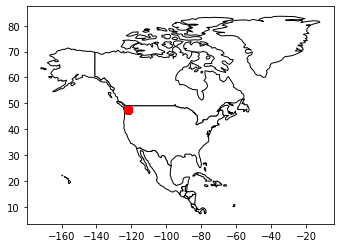

In [41]:
#QUICK TEST PLOT to make sure the data is behaving as expected - should
# see points clustered in U.S. Pacific NW

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# We restrict to North America.
ax = world[world.continent == 'North America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, color='red')

plt.show()

In [42]:
#reading in the police shapefile data
police_gdf = gpd.read_file('GIS_data/Police_Station_Locations_in_King_County___kcp_loc_point.shp')
police_gdf.head()

,OBJECTID,FEATURE_ID,ESITE,CODE,NAME,ABB_NAME,ADDRESS,ZIPCODE,CITY,STATE_NAME,PHONE,DISTRICT,FAC_CLASS,NEWSTA,RESOLUTION,WEBSITE,PIN,MAJOR,MINOR,geometry
0,1,650070,419120,65,WSP District 2 Seattle North Detachment,WSP District 2 Seattle N Detatch,811 E Roanoke,98102,Seattle,WA,(206) 720-3040,SE,0,X,placed manually (bldg. believed to be next to ...,http://www.wsp.wa.gov/traveler/d2detach.htm,5535100285,553510,0285,POINT (-122.32153 47.64298)
1,2,650016,500461,65,White Center Storefront,White Center,1327 SW 102nd St,98146,Unincorporated King County,WA,(206) 477-1237,SE,6,X,unsure of location/QC- address matches parcel ...,http://www.kingcounty.gov/depts/sheriff/police...,7973202900,797320,2900,POINT (-122.35535 47.51703)
2,3,650084,764142,65,KC Airport Law Enforcement,KC Airport Law Enforcement,7277 Perimeter Rd S,98108,Seattle,WA,(206) 296-7392,KC,0,Y,added 9/04,http://www.kingcounty.gov/depts/sheriff/police...,2824049007,282404,9007,POINT (-122.30414 47.53738)
3,4,650008,611396,65,Fairwood Storefront,Fairwood,17620 140th Ave SE,98058,Unincorporated King County,WA,(206) 477-1243,RN,6,X,QC- address from 17240 140th Ave,http://www.kingcounty.gov/depts/sheriff/police...,7560800010,756080,0010,POINT (-122.15196 47.44443)
4,5,650001,620199,65,KC Precinct 3 Headquarters,KC Precinct 3 HQ,22300 SE 231st St,98038,Maple Valley,WA,(206) 477-6446,MV,1,E,"moved slightly to current location/QC, added n...",http://www.kingcounty.gov/depts/sheriff/police...,1622069143,162206,9143,POINT (-122.04414 47.39509)


In [43]:
import folium

In [44]:
### Mapping out police stations (blue) compared to house locations (white) 
## Created this as a further test of mapping options
m = folium.Map([47.452936, -121.850514], tiles='CartoDb dark_matter')

locs_police = [(x,y) for x,y in zip(police_gdf['geometry'].y, police_gdf['geometry'].x)]

locs_houses = [(x,y) for x,y in zip(gdf['geometry'].y, gdf['geometry'].x)]


for location in locs_houses:
    folium.CircleMarker(location = location, color = 'white', radius = .5).add_to(m)

for location in locs_police:
    folium.CircleMarker(location = location, color='blue', radius=4 ).add_to(m)
    

m

In [45]:
from scipy.spatial import cKDTree
from shapely.geometry import Point

In [46]:
# the below cell was used in creating the function that can now be found
# in 'distance_function.py'
# def ckdnearest(gdA, gdB, name):
    
#     nA = np.array(list(gdA.geometry.apply(lambda x: (x.x, x.y))))
#     nB = np.array(list(gdB.geometry.apply(lambda x: (x.x, x.y))))
#     btree = cKDTree(nB)
    
#     dist, idx = btree.query(nA, k=1)
    
#     gdB_nearest = gdB.iloc[idx].drop(columns='geometry').reset_index(drop=True)
#     gdf = pd.concat(
#         [
#             gdA.reset_index(drop=True),
#             gdB_nearest[name],
#             pd.Series(dist, name='dist')
#         ],
#         axis = 1)
    
#     return gdf

In [47]:
#importing custom function
from distance_function import *

In [48]:
#get nearest police station and distance for each house in the GeoDataFrame
police_updated_gdf = ckdnearest(gdf, police_gdf, 'NAME')

In [49]:
# changing column names for clarity
police_updated_gdf = police_updated_gdf.rename(columns={"dist": "police_station_dist", "NAME": "Police_Station_NAME"})


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20911 entries, 0 to 20910
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   police_station_dist  20911 non-null  float64
 1   Police_Station_NAME  20911 non-null  object 
dtypes: float64(1), object(1)
memory usage: 326.9+ KB


In [50]:
police_updated_gdf.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,view_y_n,geometry,Police_Station_NAME,police_station_dist
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,Average,7 Average,...,0.0,98178,47.5112,-122.257,1340,5650,0,POINT (-122.25700 47.51120),West Hill Storefront,0.027330
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,Average,7 Average,...,1991.0,98125,47.7210,-122.319,1690,7639,0,POINT (-122.31900 47.72100),Seattle Police North Precinct,0.023986
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,Average,6 Low Average,...,0.0,98028,47.7379,-122.233,2720,8062,0,POINT (-122.23300 47.73790),Kenmore Police Department,0.027925
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,Very Good,7 Average,...,0.0,98136,47.5208,-122.393,1360,5000,0,POINT (-122.39300 47.52080),Seattle Police Southwest Precinct,0.034575
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,Average,8 Good,...,0.0,98074,47.6168,-122.045,1800,7503,0,POINT (-122.04500 47.61680),Sammamish Police Department,0.017513


In [51]:
# the below cells use the same process to find nearest location and distance
# as was used with the police station file
medical_gdf = gpd.read_file('GIS_data/Medical_Facilities_including_Hospitals___medical_facilities_point.shp')

medical_updated_gdf = ckdnearest(gdf, medical_gdf, 'NAME')


In [52]:
medical_updated_gdf = medical_updated_gdf.rename(columns={'dist': 'medical_dist', 'NAME': 'medical_name'})


In [53]:
medical_dists = medical_updated_gdf[['medical_dist', 'medical_name']].copy()
medical_dists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20911 entries, 0 to 20910
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   medical_dist  20911 non-null  float64
 1   medical_name  20911 non-null  object 
dtypes: float64(1), object(1)
memory usage: 326.9+ KB


In [54]:

schools_gdf = gpd.read_file('GIS_data/School_Sites_in_King_County___schsite_point.shp')
schools_gdf['FEATUREDES'].value_counts()

School-Elementary               345
School-Junior High/Middle        80
School-High                      73
School-Alternative               64
School-Other Facility            32
School-College or University     31
School-K-12                      17
Name: FEATUREDES, dtype: int64

In [55]:
schools_gdf.head()

,OBJECTID,FEATURE_ID,ESITE,CODE,NAME,ABB_NAME,ADDRESS,ZIPCODE,LONG_CEN,LAT_CEN,SCH_CLASS,DISTRICT,PIN,MAJOR,MINOR,FEATUREDES,OSPI_CODE,geometry
0,1,207,80,662,Sammamish High School,Sammamish,100 140th Ave SE,98005,-122.152305,47.608458,10.0,BELLEVUE,3425059019,342505,9019,School-High,3282.0,POINT (-122.15230 47.60846)
1,2,263,113,660,Saint Brendan Catholic School,Saint Brendan,10049 NE 195th St,98011,-122.205416,47.768905,20.0,NORTHSHORE,0526059084,052605,9084,School-Elementary,0.0,POINT (-122.20541 47.76891)
2,3,884,527409,660,Highland Park Elementary School,Highland Park,1012 SW Trenton St,98106,-122.348456,47.525263,10.0,SEATTLE,7972603210,797260,3210,School-Elementary,2269.0,POINT (-122.34845 47.52527)
3,4,475,8634,660,Lakeview Elementary School,Lakeview,10400 NE 68th St,98033,-122.200171,47.667242,10.0,LAKE WASHINGTON,7882600132,788260,0132,School-Elementary,3041.0,POINT (-122.20017 47.66724)
4,5,1093,12282,662,Nathan Hale High School,Nathan Hale,10750 30th Ave NE,98125,-122.294728,47.708040,10.0,SEATTLE,2826049152,282604,9152,School-High,3479.0,POINT (-122.29473 47.70804)


In [56]:
# breaking out by school type as we considered digging deeper into this
# category during the model construction

elementary_gdf= schools_gdf[schools_gdf['FEATUREDES'] == 'School-Elementary']
middle_gdf = schools_gdf[schools_gdf['FEATUREDES'] == 'School-Junior High/Middle']
high_gdf = schools_gdf[schools_gdf['FEATUREDES'] == 'School-High']


In [57]:
schools_updated_gdf = ckdnearest(gdf,schools_gdf, 'NAME')
schools_updated_gdf = schools_updated_gdf.rename(columns={"dist": "school_dist", "NAME": "school_NAME"})
schools_updated_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20911 entries, 0 to 20910
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             20911 non-null  int64   
 1   date           20911 non-null  object  
 2   price          20911 non-null  float64 
 3   bedrooms       20911 non-null  int64   
 4   bathrooms      20911 non-null  float64 
 5   sqft_living    20911 non-null  int64   
 6   sqft_lot       20911 non-null  int64   
 7   floors         20911 non-null  float64 
 8   condition      20911 non-null  object  
 9   grade          20911 non-null  object  
 10  sqft_above     20911 non-null  int64   
 11  sqft_basement  20911 non-null  float64 
 12  yr_built       20911 non-null  int64   
 13  yr_renovated   20911 non-null  float64 
 14  zipcode        20911 non-null  int64   
 15  lat            20911 non-null  float64 
 16  long           20911 non-null  float64 
 17  sqft_living15  20911 no

In [58]:


farm_markets_gdf = gpd.read_file('GIS_data/Farmers_Markets_in_King_County___farmers_markets_point.shp')
farm_markets_gdf.head()

,OBJECTID,FEATURE_ID,ESITE,CODE,NAME,ABB_NAME,ADDRESS,ZIPCODE,CITY,LOCATION,WEBSITE,COUNTYNAME,START_DATE,END_DATE,DAYOFWEEK,STARTTIME,ENDTIME,CRDITDEBIT,EBTFDSTAMP,geometry
0,1,903044,0,903,Lake Forest Park Farmers Market,Lake Forest Park Farmers Market,17171 Bothell Way NE,91855,Lake Forest Park,17171 Bothell Way NE,https://www.thirdplacecommons.org,King,2020-05-10,2020-10-25,Sundays,10AM,3PM,FALSE,TRUE,POINT (-122.27900 47.75290)
1,2,903051,0,903,Kirkland Wednesday Market,Kirkland Wednesday Market,111 Park Lane,98033,Kirkland,Park Lane between Lake & Main Street,http://www.kirklandmarket.org/,King,2020-06-03,2020-09-23,Wednesdays,2PM,7PM,TRUE,TRUE,POINT (-122.20600 47.67590)
2,3,903061,0,903,Issaquah Farmers Market,Issaquah Farmers Market,1730 10th Ave. N.W.,98027,Issaquah,1730 10th Ave NW,https://www.issaquahwa.gov/index.aspx?nid=778,King,2020-06-06,2020-09-26,Saturdays,9AM,2PM,TRUE,FALSE,POINT (-122.04956 47.55018)
3,4,10000051,1231461,903,Tukwila Village Farmers Market,Tukwila Village Farmers Market,14350 Tukwila International Blvd,98168,Tukwila,14350 Tukwila International Blvd,https://www.foodinnovationnetwork.org/markets,King,2020-06-04,2020-10-15,Wednesdays,4PM,7PM,FALSE,FALSE,POINT (-122.28309 47.47448)
4,5,903074,0,903,Duvall Farmers Market,Duvall Farmers Market,"Taylor Landing, N of Bridge into downtown Duva...",98019,Duvall,"Taylor Landing, N of Bridge into downtown Duva...",http://www.duvallfarmersmarket.org,King,2020-05-07,2020-10-08,Thursdays,3PM,7PM,TRUE,TRUE,POINT (-121.98683 47.74428)


In [59]:
farm_markets_updated_gdf = ckdnearest(gdf,farm_markets_gdf, 'NAME')
farm_markets_updated_gdf = farm_markets_updated_gdf.rename(columns={"dist": "farm_market_dist", "NAME": "farm_market_NAME"})
farm_markets_updated_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20911 entries, 0 to 20910
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                20911 non-null  int64   
 1   date              20911 non-null  object  
 2   price             20911 non-null  float64 
 3   bedrooms          20911 non-null  int64   
 4   bathrooms         20911 non-null  float64 
 5   sqft_living       20911 non-null  int64   
 6   sqft_lot          20911 non-null  int64   
 7   floors            20911 non-null  float64 
 8   condition         20911 non-null  object  
 9   grade             20911 non-null  object  
 10  sqft_above        20911 non-null  int64   
 11  sqft_basement     20911 non-null  float64 
 12  yr_built          20911 non-null  int64   
 13  yr_renovated      20911 non-null  float64 
 14  zipcode           20911 non-null  int64   
 15  lat               20911 non-null  float64 
 16  long          

In [60]:
#without resetting the index we couldn't combine the new datacolumns with
# the original GeoDataFrame.  This is a major issue with this function
# and one that would need to be worked out if you added this data post-
# train/test split
gdf.reset_index(drop = True, inplace=True)

In [62]:
gdf.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,view_y_n,geometry
20906,7936000429,3/26/2015,1010000.0,4,3.5,3510,7200,2.0,Average,9 Better,...,910.0,2009,0.0,98136,47.5537,-122.398,2050,6200,0,POINT (-122.39800 47.55370)
20907,2997800021,2/19/2015,475000.0,3,2.5,1310,1294,2.0,Average,8 Good,...,130.0,2008,0.0,98116,47.5773,-122.409,1330,1265,0,POINT (-122.40900 47.57730)
20908,263000018,5/21/2014,360000.0,3,2.5,1530,1131,3.0,Average,8 Good,...,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509,0,POINT (-122.34600 47.69930)
20909,6600060120,2/23/2015,400000.0,4,2.5,2310,5813,2.0,Average,8 Good,...,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200,0,POINT (-122.36200 47.51070)
20910,291310100,1/16/2015,400000.0,3,2.5,1600,2388,2.0,Average,8 Good,...,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287,0,POINT (-122.06900 47.53450)


In [65]:
# there's probably a better way to combine all the newly generated 
# information.....

gdf['police_dist'] = police_updated_gdf['police_station_dist']
gdf['police_name'] = police_updated_gdf['Police_Station_NAME']
gdf['school_dist'] = schools_updated_gdf['school_dist']
gdf['school_name'] = schools_updated_gdf['school_NAME']
gdf['medical_dist'] = medical_updated_gdf['medical_dist']
gdf['medical_name'] = medical_updated_gdf['medical_name']
gdf['farmers_dist'] = farm_markets_updated_gdf['farm_market_dist']
gdf['farmers_name'] = farm_markets_updated_gdf['farm_market_NAME']
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20911 entries, 0 to 20910
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             20911 non-null  int64   
 1   date           20911 non-null  object  
 2   price          20911 non-null  float64 
 3   bedrooms       20911 non-null  int64   
 4   bathrooms      20911 non-null  float64 
 5   sqft_living    20911 non-null  int64   
 6   sqft_lot       20911 non-null  int64   
 7   floors         20911 non-null  float64 
 8   condition      20911 non-null  object  
 9   grade          20911 non-null  object  
 10  sqft_above     20911 non-null  int64   
 11  sqft_basement  20911 non-null  float64 
 12  yr_built       20911 non-null  int64   
 13  yr_renovated   20911 non-null  float64 
 14  zipcode        20911 non-null  int64   
 15  lat            20911 non-null  float64 
 16  long           20911 non-null  float64 
 17  sqft_living15  20911 no

In [66]:
# export GeoDataFrame as csv
gdf.to_csv('../../data/kc_house_data_with_GIS_V2.csv')